<a href="https://colab.research.google.com/github/pankaj-beldar/Capstone_2_Appliance_Energy_Prediction/blob/main/Copstone_2__Appliance_Energy_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Problem Statement**
Data-driven prediction of energy use of appliances
The data set is at **10 min** for about **4.5 months**. The house temperature and humidity conditions
were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the
temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for
10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters.
Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded
from a public data set from Reliable Prognosis (rp5.ru) and merged together with the
experimental data sets using the date and time column. Two random variables have been
included in the data set for testing the regression models and to filter out non-predictive attributes
(parameters).


# **Introduction**

The understanding of the appliances energy use in buildings has
been the subject of numerous research studies , since appliances represent a significant portion (between 20 and 30%  of
the electrical energy demand . For instance, in a study
in the UK for domestic buildings , appliances, such as televisions
and consumer electronics operating in standby were attributed to
a  near about 10% increase in the electricity consumption. Regression models
for energy use can help to understand the relationships between
different variables and to quantify their impact. Thus, prediction
models of electrical energy consumption in buildings can be useful for a number of applications: to determine adequate sizing of
photovoltaics and energy storage to diminish power flow into the
grid , to detect abnormal energy use patterns , to be part of
an energy management system for load control , to model
predictive control applications where the loads are needed ,
for demand side management (DSM) and demand side response
(DSR) and as an inputfor building performance simulation
analysis

# **Data Attributes**

**date:** time year-month-day hour:minute:second

**Appliances:** energy use in Wh (Dependent variable)

**lights:** energy use of light fixtures in the house in Wh (Drop this column)

**T1**, Temperature in kitchen area, in Celsius

**RH1**: Humidity in kitchen area, in % T2, 

**Temperature**: in living room area, in Celsius 

**RH2**:
Humidity in living room area, in %

**T3:** Temperature in laundry room area

**RH3:** Humidity in laundry room area, in % 

**T4:** Temperature in office room, in Celsius 

**RH4:**Humidity in office room, in %

**T5:** Temperature in bathroom, in Celsius

**RH5:** Humidity in bathroom, in % T6, Temperature outside the building (north side), in Celsius

**RH6:** Humidity outside the building (north side), in %

**T7:** Temperature in ironing room , in Celsius

**RH7:** Humidity in ironing room, in % T8, Temperature in teenager room 2, in Celsius 

**RH8**: Humidity in teenager room 2, in %

**T9:** Temperature in parents room, in Celsius

**RH9:** Humidity in parents room, in % To, Temperature outside (from Chievres weather station), inCelsius Pressure (from Chievres weather station), in mm Hg RHout, Humidity outside (from
Chievres weather station), in %

**Wind speed:** (from Chievres weather station), in m/s

**Visibility:** (from Chievres weather station), in km

**Tdewpoint:** (from Chievres weather station), Â°C

**rv1:** Random variable 1, nondimensional

**rv2:** Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station
(Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis,
rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of
weather data.

# **Importing Given Dataset and Requied libraries**

In [114]:
#importing different libraries required for regression analysis
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [115]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [116]:
# read dataset from pandas library and convert 'date' column to DateTime format
df = pd.read_csv('/content/data_application_energy.csv', parse_dates=['date'])


# **Lets, Have a look on Data!**

In [117]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [118]:
df.shape

(19735, 29)

Data have 19735 readings and 29 Attiributes

In [119]:
#now Dropping Lights column as per instruction in Problem Statement
df.drop('lights', axis =1, inplace = True)

In [120]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         19735 non-null  datetime64[ns]
 1   Appliances   19735 non-null  int64         
 2   T1           19735 non-null  float64       
 3   RH_1         19735 non-null  float64       
 4   T2           19735 non-null  float64       
 5   RH_2         19735 non-null  float64       
 6   T3           19735 non-null  float64       
 7   RH_3         19735 non-null  float64       
 8   T4           19735 non-null  float64       
 9   RH_4         19735 non-null  float64       
 10  T5           19735 non-null  float64       
 11  RH_5         19735 non-null  float64       
 12  T6           19735 non-null  float64       
 13  RH_6         19735 non-null  float64       
 14  T7           19735 non-null  float64       
 15  RH_7         19735 non-null  float64       
 16  T8  

In [129]:
df.isnull().sum()

Appliances      0
T1              0
RH_1            0
T2              0
RH_2            0
T3              0
RH_3            0
T4              0
RH_4            0
T5              0
RH_5            0
T6              0
RH_6            0
T7              0
RH_7            0
T8              0
RH_8            0
T9              0
RH_9            0
T_out           0
Press_mm_hg     0
RH_out          0
Windspeed       0
Visibility      0
Tdewpoint       0
rv1             0
rv2             0
time_of_day     0
day_of_month    0
day_of_week     0
month           0
month_name      0
day_name        0
Phase_of_Day    0
dtype: int64

by looking at data info , It is observed that all the features are of a numerical  (float -datatype) except date column and no null values are present in the given data.

In [121]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [122]:
#check name of columns 
df.columns

Index(['date', 'Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

Lets check duplicate rows

In [123]:
df.duplicated().any()

False

Lets utilise the 'date' colomn to extract **time of day, day of month, day of week, month, month name, day name** to find out more insights from time series data.

In [124]:
df['date'] = pd.to_datetime(df['date']) # convert into DateTime format
df['time_of_day'] = df['date'].dt.hour 
df['day_of_month'] = df['date'].dt.day 
df['day_of_week'] = df['date'].dt.dayofweek
df['month']=df['date'].dt.month
df['month_name']=df['date'].dt.month_name()
df['day_name'] = df['date'].dt.day_name()

In [125]:
df.head()

,date,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month,month_name,day_name
0,2016-01-11 17:00:00,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,63.000000,5.3,13.275433,13.275433,17,11,0,1,January,Monday
1,2016-01-11 17:10:00,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,59.166667,5.2,18.606195,18.606195,17,11,0,1,January,Monday
2,2016-01-11 17:20:00,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,55.333333,5.1,28.642668,28.642668,17,11,0,1,January,Monday
3,2016-01-11 17:30:00,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,51.500000,5.0,45.410389,45.410389,17,11,0,1,January,Monday
4,2016-01-11 17:40:00,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,47.666667,4.9,10.084097,10.084097,17,11,0,1,January,Monday


Lets create Categorical feature based on time as the phase of the day as Evening, Night, Morning, Afternoon

In [126]:
def phase_day(row):
  if 18 <= int(row['time_of_day'])<24:
    return 'Evening'
  if 6 > int(row['time_of_day']):
    return 'Night'
  if 6 <= int(row['time_of_day']) <12:
    return 'Morning'
  if 12 <= int(row['time_of_day'])< 18:
    return 'AfterNoon'


In [127]:
df['Phase_of_Day'] = df.apply(lambda row: phase_day(row), axis =1)

In [128]:
#Drop date column as we dont need it as far as time series analysis is concerned
df.drop('date', axis =1, inplace = True)

In [16]:
df.columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'time_of_day', 'day_of_month', 'day_of_week',
       'month', 'month_name', 'day_name', 'Phase_of_Day'],
      dtype='object')

In [17]:
#Identify the Types of Features eg. numerical_features, dependent_feature, categorical_feature
numerical_features = [ 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'time_of_day', 'day_of_month']
dependent_feature = ['Appliances']
categorical_feature = [ 'Phase_of_Day','day_of_week']

In [18]:
df.head()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month,month_name,day_name,Phase_of_Day
0,60,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,...,5.3,13.275433,13.275433,17,11,0,1,January,Monday,AfterNoon
1,60,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,...,5.2,18.606195,18.606195,17,11,0,1,January,Monday,AfterNoon
2,50,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,...,5.1,28.642668,28.642668,17,11,0,1,January,Monday,AfterNoon
3,50,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,...,5.0,45.410389,45.410389,17,11,0,1,January,Monday,AfterNoon
4,60,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,...,4.9,10.084097,10.084097,17,11,0,1,January,Monday,AfterNoon


In [19]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,...,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033,11.502002,16.057411,2.977249,3.101647
std,102.524891,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,...,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634,6.921953,8.450998,1.985617,1.339200
min,10.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,...,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322,0.000000,1.000000,0.000000,1.000000
25%,50.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,...,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889,6.000000,9.000000,1.000000,2.000000
50%,60.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,...,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653,12.000000,16.000000,3.000000,3.000000
75%,100.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,...,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769,17.000000,23.000000,5.000000,4.000000
max,1080.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,...,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530,23.000000,31.000000,6.000000,5.000000


#**Exploratory** **Data** **Analysis** **[EDA]**



##Univariate Analysis

###Numerical Features

In [131]:
df.describe().columns

Index(['Appliances', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4',
       'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9',
       'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'time_of_day', 'day_of_month', 'day_of_week',
       'month'],
      dtype='object')

 #### Distribution 

In [132]:
len(numerical_features)

27

Lets plot the distribution plot of each variable with distribution plot to check wheather all variables are normally distributed or not. 

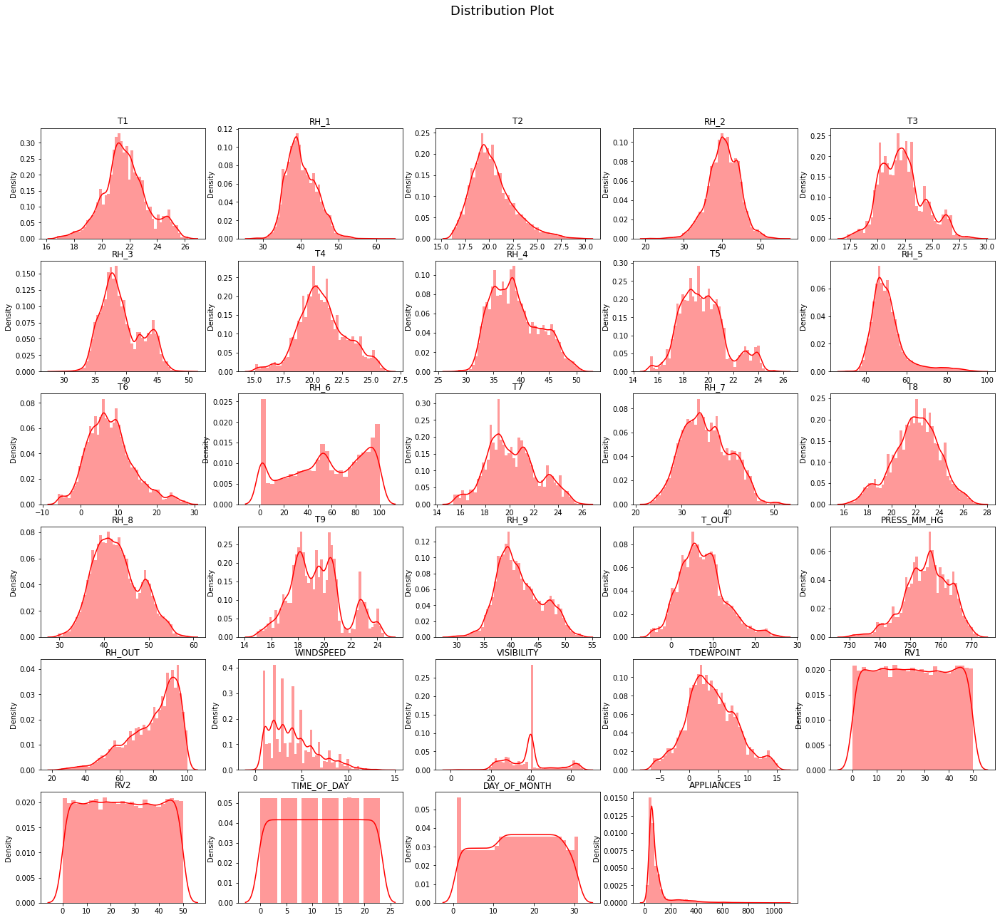

In [21]:
plt.figure(figsize=(24, 20))
plt.suptitle("Distribution Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features + ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    sns.distplot(df[ticker], color='r')
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

from above distribution plot we can conclude that variables time_of_day, rv2, day_of_month, appliances, rh6, rv1, T9, T3, windspeed, visibility are not normally distributed. other variables are seems to be normally distributed.

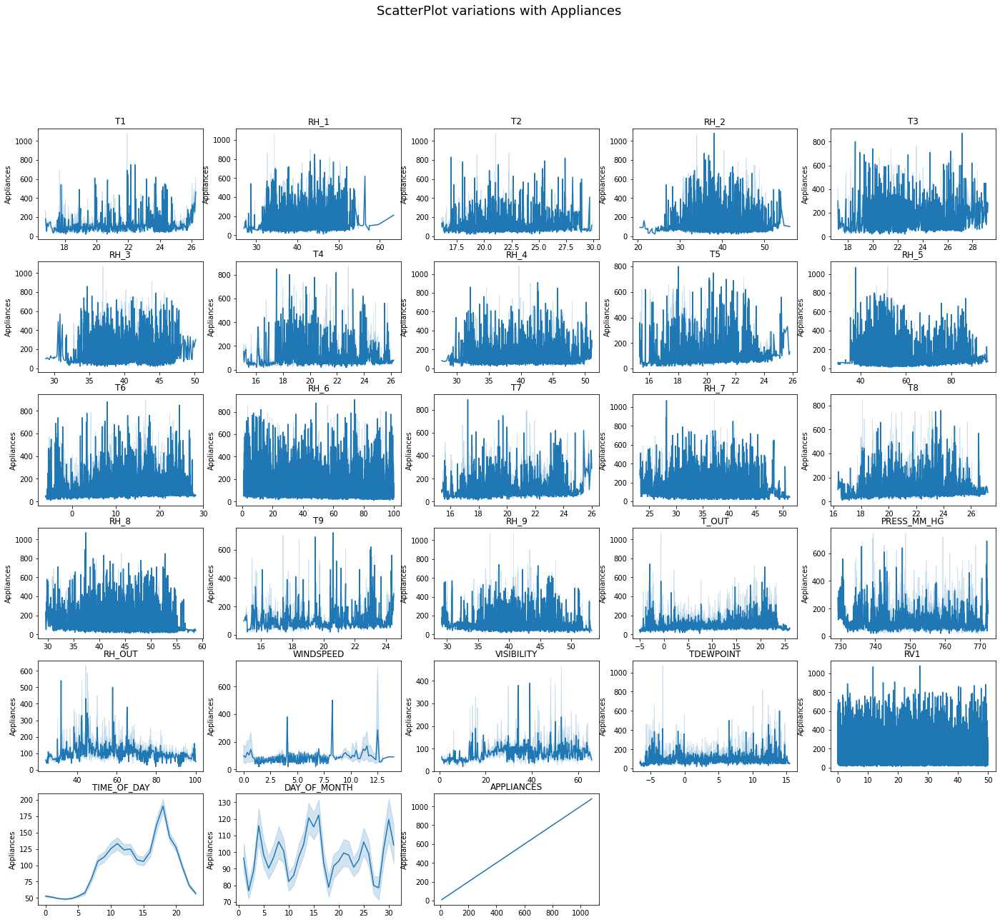

In [134]:
plt.figure(figsize=(24, 20))
plt.suptitle("linePlot variations with Appliances ", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features + ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    sns.lineplot(df[ticker], x='ticker', y=df['Appliances'])
    ax.set_title(ticker.upper())
    ax.set_xlabel("")

as Appliances is our dependent variable hence to find out the pattern of correlation with dependent variable , we have plotted the scatter plot of each variable with dependent variable. 
1. Energy consumption in kitchen area is less as compared to living room area.
2. Energy consumption bathroom, laundry area is more.
3. maximum Energy consumtion is from 12pm to 6pm time period.

#### Q-Q plot

When the quantiles of two variables are plotted against each other, then the plot obtained is known as quantile – quantile plot or qqplot. This plot provides a summary of whether the distributions of two variables are similar or not with respect to the locations.

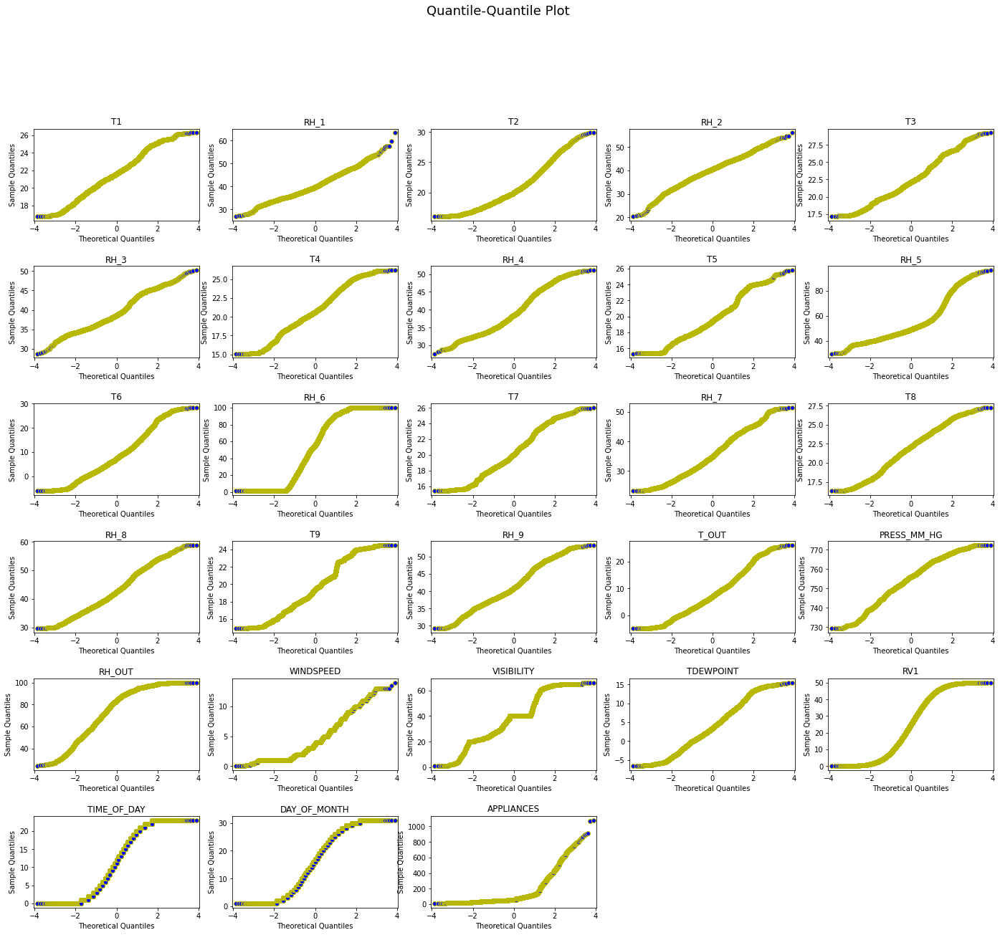

In [139]:
import statsmodels.api as sm
import pylab as py
import scipy.stats as stats

plt.figure(figsize=(24, 20))
plt.suptitle("Quantile-Quantile Plot", fontsize=18, y=1)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    ax = plt.subplot(6, 5, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sm.qqplot(df[ticker] ,color='y', ax = ax)
    ax.set_title(ticker.upper())

The quantile-quantile (q-q) plot is a graphical technique for determining if two data sets come from populations with a common distribution.

There is large variaction in  QQ plot of variables time_of_day, rv2, day_of_month, appliances, rh6, rv1, T9, T3, windspeed, visibility

####Box Plot

#Lets plot BOXPLOT to visualize the outliers in each variables

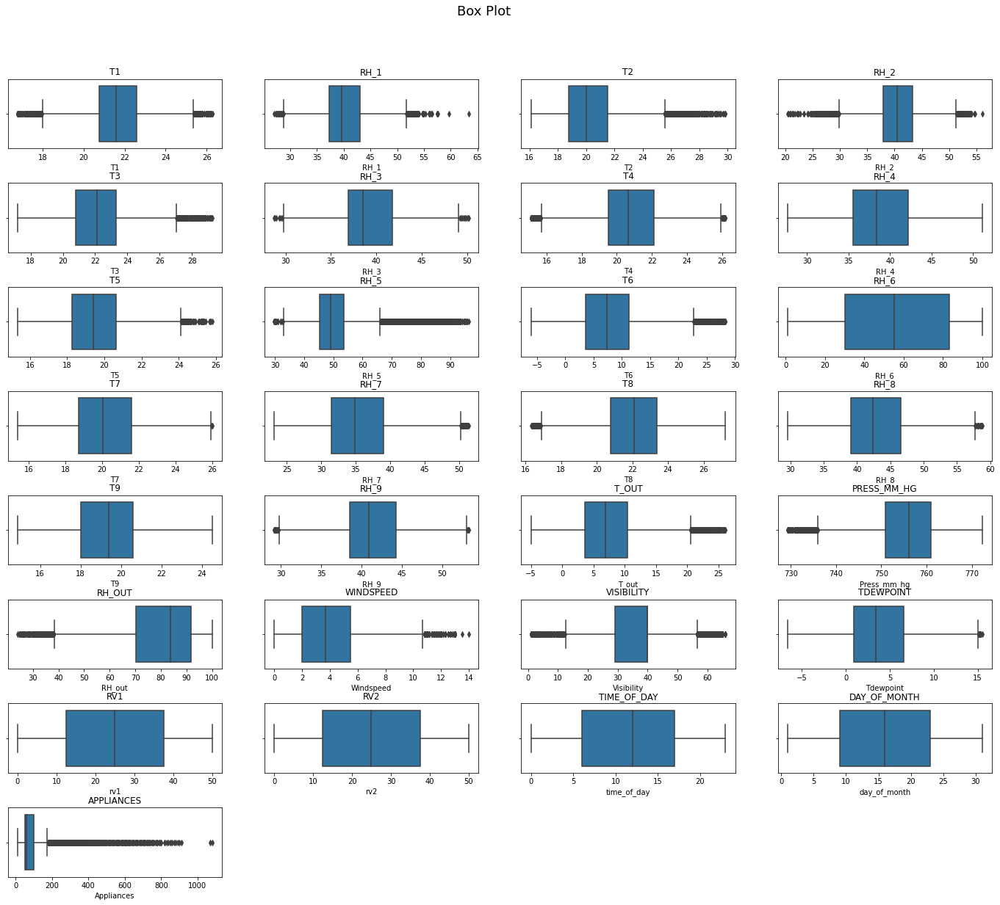

In [24]:

plt.figure(figsize=(24, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(numerical_features+ ['Appliances']):
    
    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    
    sns.boxplot(df[ticker],ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

Most of the appliances consume energy in between 0-200 Wh. 

Text(0.5, 1.0, 'Hourly Day Consumption')

<Figure size 720x360 with 0 Axes>

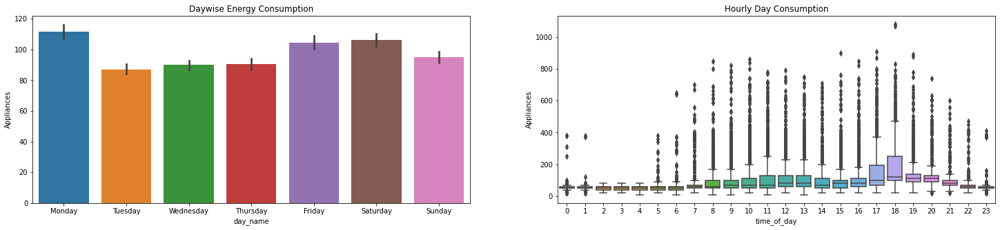

In [25]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.barplot(data=df, x='day_name', y='Appliances', ax=ax[0])
sns.boxplot(data=df, x='time_of_day', y='Appliances', ax=ax[1])
ax[0].set_title('Daywise Energy Consumption')
ax[1].set_title('Hourly Day Consumption')

1. Energy consumption on Monday is high, followed by saturday, friday and sunday.
2. Energy consumption from 6am to 11 am is high. whereas less in between 12 am to 6am. 

In [26]:
df.corr()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,time_of_day,day_of_month,day_of_week,month
Appliances,1.000000,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,0.019760,...,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145,0.216792,0.002366,0.003060,-0.011606
T1,0.055447,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,0.885247,...,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203,0.178858,-0.127088,0.001381,0.706305
RH_1,0.086031,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,0.205797,...,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699,0.018594,-0.041397,-0.053782,-0.094048
T2,0.120073,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,0.720550,...,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087,0.254784,-0.156913,0.000602,0.533479
RH_2,-0.060465,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,0.110409,...,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275,-0.183322,0.037117,-0.044249,-0.097914
T3,0.085060,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,0.888169,...,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194,0.037624,-0.077190,-0.017514,0.790365
RH_3,0.036292,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,-0.050062,...,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477,-0.052392,-0.048427,-0.035182,-0.414359
T4,0.040281,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,0.871813,...,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815,0.088407,-0.121867,-0.091006,0.789168
RH_4,0.016965,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,0.091812,...,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787,-0.019068,-0.005404,-0.005749,-0.258167
T5,0.019760,0.885247,0.205797,0.720550,0.110409,0.888169,-0.050062,0.871813,0.091812,1.000000,...,-0.273953,-0.145011,-0.084164,0.588362,-0.005490,-0.005490,0.071340,-0.128832,-0.040827,0.785865


###Categorical Features

Text(0.5, 1.0, 'Daywise Consumption')

<Figure size 720x360 with 0 Axes>

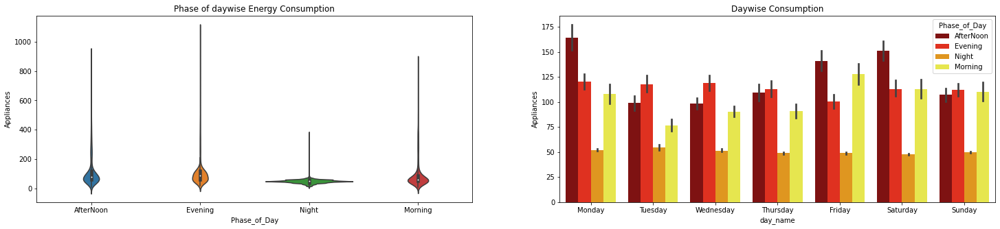

In [27]:
plt.figure(figsize=(10,5))
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(25, 5))
ax = axes.flatten()
sns.violinplot(x='Phase_of_Day', y='Appliances', data =df, ax=ax[0])
sns.barplot(data=df, x='day_name', y='Appliances',hue='Phase_of_Day',palette='hot' ,ax=ax[1])
ax[0].set_title('Phase of daywise Energy Consumption')
ax[1].set_title('Daywise Consumption')

1. Energy consumption at night is less compared to morning and afternoon.
2. Energy consumption is high in the evening. whereas its high on monday, friday and saturday in the afternoon.

##Bivariate Analysis

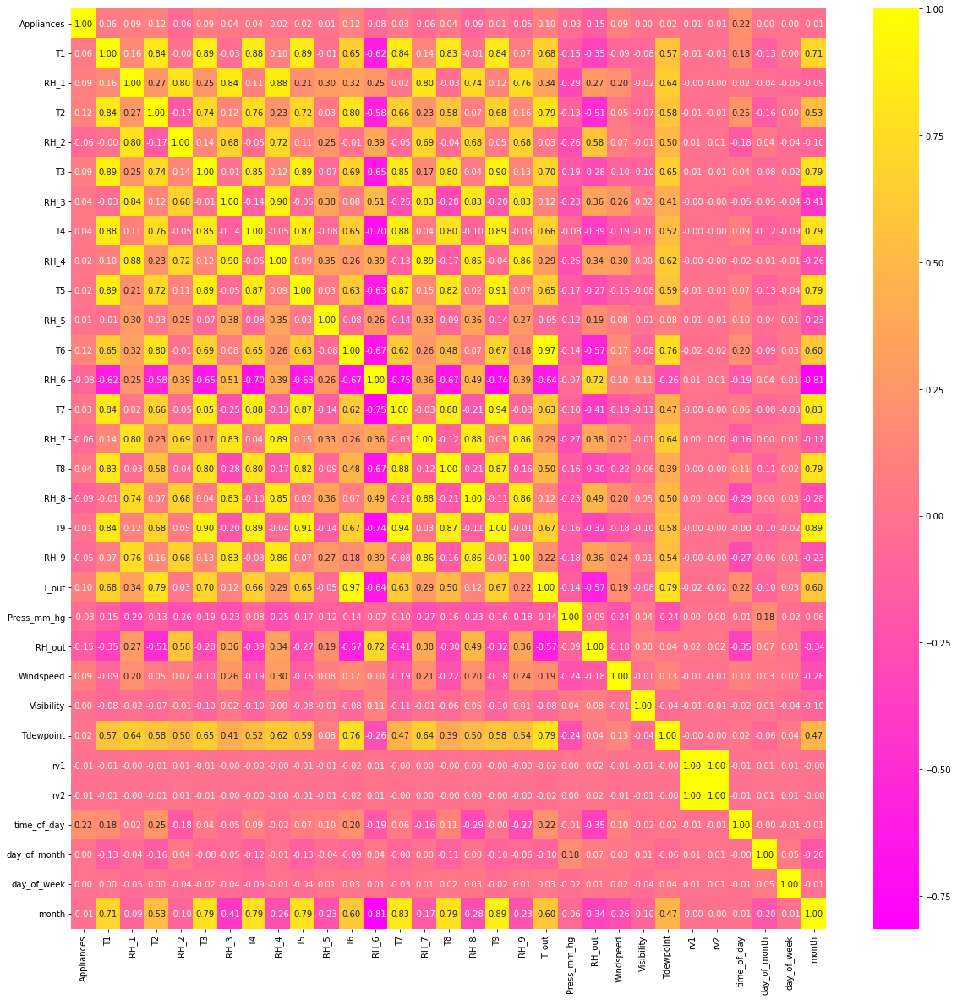

In [28]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, cmap='spring', fmt='.2f')

1. T9 ang T6 are highly correlated as 0.94 ,and also T_out and T6 are as 0.97

'rv1' and 'rv2' have correlation of 1

In [29]:
(df['rv1'] ==df['rv2']).unique()

array([ True])

Since both the features are identical, one of them is eliminated from the dataset

In [30]:
df.drop('rv2', axis = 1, inplace = True)
numerical_features.remove('rv2')

In [31]:
numerical_features

['T1',
 'RH_1',
 'T2',
 'RH_2',
 'T3',
 'RH_3',
 'T4',
 'RH_4',
 'T5',
 'RH_5',
 'T6',
 'RH_6',
 'T7',
 'RH_7',
 'T8',
 'RH_8',
 'T9',
 'RH_9',
 'T_out',
 'Press_mm_hg',
 'RH_out',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'time_of_day',
 'day_of_month']

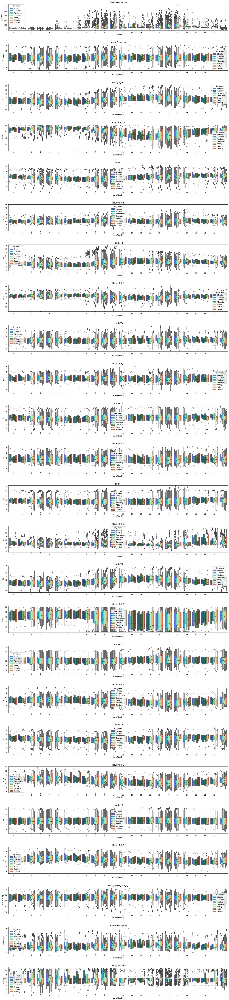

In [32]:
measurements = ['Appliances','Tdewpoint','T_out','RH_out','T1','RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','T6','RH_6','T7','RH_7','T8','RH_8','T9','RH_9','Press_mm_hg','Windspeed','Visibility',]
plt.figure(figsize=(25, 120))
for n, measurement in enumerate(measurements):
    # add a new subplot iteratively
    ax = plt.subplot(26, 1, n + 1)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    sns.boxplot(x= df['time_of_day'], y = df[measurement], hue = df['day_name'] ,palette = 'rainbow', ax = ax)
    plt.xticks(np.arange(0,23,1))
    plt.title(f"Hourly {measurement}")
    plt.xlabel("Hour of the Day")
    plt.ylabel(measurement)
plt.show()


#Feature Engineering and Selection



## Numerical Outliers

Transformation to make data more gaussian distributed

<Figure size 1800x1800 with 0 Axes>

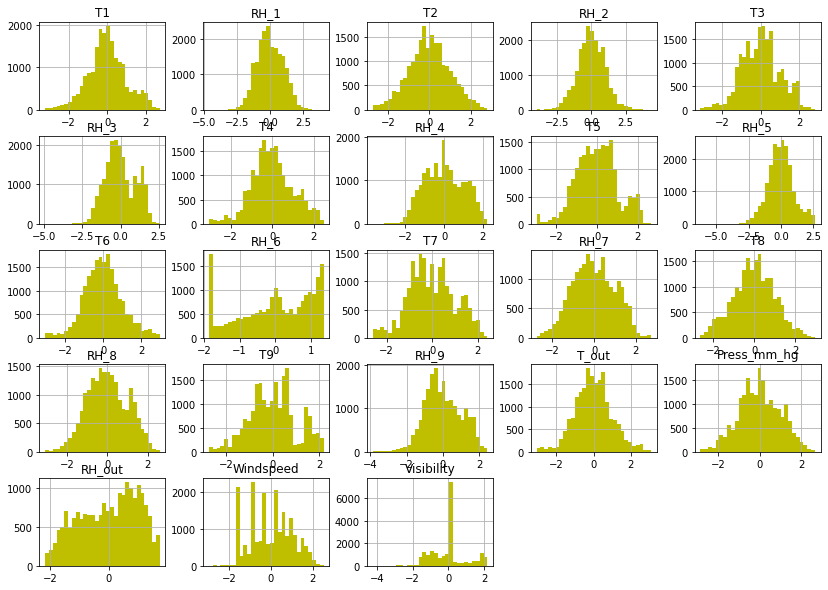

In [33]:
from sklearn.preprocessing import PowerTransformer
plt.figure(figsize=(25,25))
# Init
pt = PowerTransformer()

df[numerical_features[:-4]] = pd.DataFrame(pt.fit_transform(df[numerical_features[:-4]]), columns= numerical_features[:-4])

df[numerical_features[:-4]].hist(figsize=(14, 10), bins = 30, color='y');

### Handling Outliers

#### Inter Quantile method

In [34]:

for ftr in numerical_features+['Appliances']  : 
  print(ftr,'\n')
  q25, q75 = np.percentile(df[ftr], 25), np.percentile(df[ftr], 75)
  iqr = q75 - q25
  print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
  # calculate the outlier cutoff
  cut_off = iqr * 1.5
  lower, upper = q25 - cut_off, q75 + cut_off
  print(f"\nlower = {lower} and upper = {upper} \n ")
  # identify outliers
  outliers = [x for x in df[ftr] if x < lower or x > upper]
  print('Identified outliers: %d' % len(outliers))
  #removing outliers
  if len(outliers)!=0:
    
    def label(row):
      if row[ftr] > upper: 
        return 1
      if row[ftr] < lower:
        return 1
      else:
        return 0

    def bin(row):
      if row[ftr]> upper:
        return upper
      if row[ftr] < lower:
        return lower
      else:
        return row[ftr]
    
    df[ftr + '_Outlier'] =  df.apply (lambda row: label(row), axis=1)
    df[ftr] =  df.apply (lambda row: bin(row), axis=1)
    print(f"{ftr} Outliers Removed")
  print("\n-------\n")
  
 

T1 

Percentiles: 25th=-0.565, 75th=0.581, IQR=1.146

lower = -2.2836676230329873 and upper = 2.299703020355362 
 
Identified outliers: 458
T1 Outliers Removed

-------

RH_1 

Percentiles: 25th=-0.710, 75th=0.757, IQR=1.467

lower = -2.9102943560677157 and upper = 2.9580504104125733 
 
Identified outliers: 57
RH_1 Outliers Removed

-------

T2 

Percentiles: 25th=-0.681, 75th=0.669, IQR=1.350

lower = -2.7062907073386384 and upper = 2.693560404797877 
 
Identified outliers: 29
T2 Outliers Removed

-------

RH_2 

Percentiles: 25th=-0.649, 75th=0.684, IQR=1.333

lower = -2.64863648738653 and upper = 2.684322726566248 
 
Identified outliers: 253
RH_2 Outliers Removed

-------

T3 

Percentiles: 25th=-0.711, 75th=0.577, IQR=1.289

lower = -2.6443178882451766 and upper = 2.5099282440396884 
 
Identified outliers: 187
T3 Outliers Removed

-------

RH_3 

Percentiles: 25th=-0.685, 75th=0.837, IQR=1.522

lower = -2.968698096089757 and upper = 3.1200746920725844 
 
Identified outliers: 32
RH_

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 53 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Appliances           19735 non-null  float64
 1   T1                   19735 non-null  float64
 2   RH_1                 19735 non-null  float64
 3   T2                   19735 non-null  float64
 4   RH_2                 19735 non-null  float64
 5   T3                   19735 non-null  float64
 6   RH_3                 19735 non-null  float64
 7   T4                   19735 non-null  float64
 8   RH_4                 19735 non-null  float64
 9   T5                   19735 non-null  float64
 10  RH_5                 19735 non-null  float64
 11  T6                   19735 non-null  float64
 12  RH_6                 19735 non-null  float64
 13  T7                   19735 non-null  float64
 14  RH_7                 19735 non-null  float64
 15  T8                   19735 non-null 

In [36]:
df.describe()

,Appliances,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,...,T6_Outlier,T8_Outlier,RH_8_Outlier,T9_Outlier,RH_9_Outlier,T_out_Outlier,Press_mm_hg_Outlier,Visibility_Outlier,Tdewpoint_Outlier,Appliances_Outlier
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,78.887256,0.005158,0.001548,-0.000011,-0.000098,0.001266,0.001183,0.003414,0.000059,0.002020,...,0.027717,0.001115,0.001723,0.000507,0.003902,0.024880,0.000811,0.114315,0.000507,0.108335
std,42.961298,0.981467,0.993275,0.999890,0.984568,0.994727,0.995791,0.990724,0.999827,0.994382,...,0.164166,0.033370,0.041472,0.022505,0.062343,0.155762,0.028463,0.318201,0.022505,0.310811
min,10.000000,-2.283668,-2.910294,-2.706291,-2.648636,-2.644318,-2.968698,-2.522621,-3.152024,-2.663552,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,-0.564904,-0.709665,-0.681347,-0.648777,-0.711476,-0.685408,-0.632792,-0.786492,-0.682661,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,60.000000,-0.035920,-0.071628,-0.012123,-0.018626,-0.002872,-0.116141,-0.064543,-0.033580,-0.012662,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,100.000000,0.580939,0.757421,0.668616,0.684463,0.577086,0.836785,0.627093,0.790530,0.637933,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,175.000000,2.299703,2.958050,2.693560,2.684323,2.509928,2.567892,2.473632,2.243383,2.618823,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


###Train Test Split

In [37]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [38]:
X = df.drop(columns=['Appliances','day_name','month_name','Phase_of_Day'])
y=df['Appliances']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)

In [42]:
X = df.drop(columns=['Appliances','day_name','month_name','Phase_of_Day','Appliances_Outlier','T1_Outlier',
       'RH_1_Outlier', 'T2_Outlier', 'RH_2_Outlier', 'T3_Outlier',
       'RH_3_Outlier', 'T4_Outlier', 'RH_4_Outlier', 'T5_Outlier',
       'RH_5_Outlier', 'T6_Outlier', 'T8_Outlier', 'RH_8_Outlier',
       'T9_Outlier', 'RH_9_Outlier', 'T_out_Outlier', 'Press_mm_hg_Outlier',
       'Visibility_Outlier', 'Tdewpoint_Outlier'])
y=df['Appliances']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2,  random_state=5)

In [43]:
X_train.columns

Index(['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5',
       'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out',
       'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1',
       'time_of_day', 'day_of_month', 'day_of_week', 'month'],
      dtype='object')

#### Scaling

In [44]:
#function to scale
def do_scale(X_train, X_test, scaling_type = StandardScaler):
  scaler = scaling_type()
  scaler.fit(X_train)
  X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns = X_train.columns)
  X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)
  return X_train_scaled, X_test_scaled


In [45]:
X_train_scaled, X_test_scaled = do_scale(X_train,X_test)

In [46]:
X_train_scaled.shape, X_test_scaled.shape

((15788, 29), (3947, 29))

##Functions

In [47]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor, RandomForestRegressor, VotingRegressor, StackingRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [48]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,10))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

In [49]:
report = {
    'model_type':[],
    'model_name':[],
    'rmse':[],
    'mae':[],
    'R2':[],
    'adjusted R2':[]

}

In [50]:

# function to evaluate and update model and score
def evaluate(modeltype, modelname, Model, X_train, y_train, X_test, y_test):
  from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, max_error

  if modelname in report['model_name']:
    print("Prexisting Model")
    return 0
  X_tr = X_train.copy()
  X_te = X_test.copy()

  print(f"-------\nTraining {str(Model)} ...")
  Model.fit(X_tr, y_train)

  print(f"\nPredicting{str(Model)} scores ...")

  y_pred = Model.predict(X_te)

  mae = mean_absolute_error(y_test,y_pred)
  report['mae'].append(mae)


  R2 = r2_score(y_test,y_pred)
  report['R2'].append(R2)

  rmse = np.sqrt(mean_squared_error(y_test,y_pred))
  report['rmse'].append(rmse)

  adj_r2=1-(1-r2_score(y_test**2,y_pred**2))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))
  report['adjusted R2'].append(adj_r2)


  report['model_name'].append(modelname)
  report['model_type'].append(modeltype)

  plt.figure(figsize=(20,10))
  plt.plot((y_pred)[:100])
  plt.plot((np.array(y_test)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title(modelname)
  plt.show()



  print(f"\nReport Updated\n----------\n")




In [51]:
#displays report in a dataframe
def display_report():
  return pd.DataFrame(report)

In [52]:
def get_models():
  models, names, model_type = list(), list(), list()

  # LinearReg
  models.append(LinearRegression())
  names.append('Linear Regression')
  model_type.append('Linear')

  #Lasso
  models.append(Lasso(alpha =0.2))
  names.append('Lasso Regression')
  model_type.append('Linear')

  #Ridge
  models.append(Ridge(alpha =0.5))
  names.append('Ridge Regression')
  model_type.append('Linear')


  # DecisionTree
  models.append((DecisionTreeRegressor()))
  names.append('DecisionTree Regressor')
  model_type.append('Tree')

  #RandomForest
  models.append(RandomForestRegressor())
  names.append('RandomForest Regressor')
  model_type.append('Ensemble Method')


  # AdaBoosting
  models.append(AdaBoostRegressor())
  names.append('Adaptive Boosting Regressor')
  model_type.append('Ensemble Method')

  # GradientBoosting
  models.append(GradientBoostingRegressor())
  names.append('GradientBoosting Regressor')
  model_type.append('Ensemble Method')

  #Bagging
  models.append(BaggingRegressor())
  names.append('Bagging Regressor')
  model_type.append('Ensemble Method')


  # KNN
  models.append(KNeighborsRegressor())
  names.append('K Neighbors Regressor')
  model_type.append('Neighbours')

  #Linear SVM
  models.append(LinearSVR())
  names.append('Linear SVR')
  model_type.append('SVM')
  
  return models, names, model_type

##Random Variable Evaluation

In [53]:
X_train_scaled.drop('rv1', axis =1, inplace = True)
X_test_scaled.drop('rv1', axis =1, inplace = True)

## Spotchecking ML Models

-------
Training LinearRegression() ...

PredictingLinearRegression() scores ...


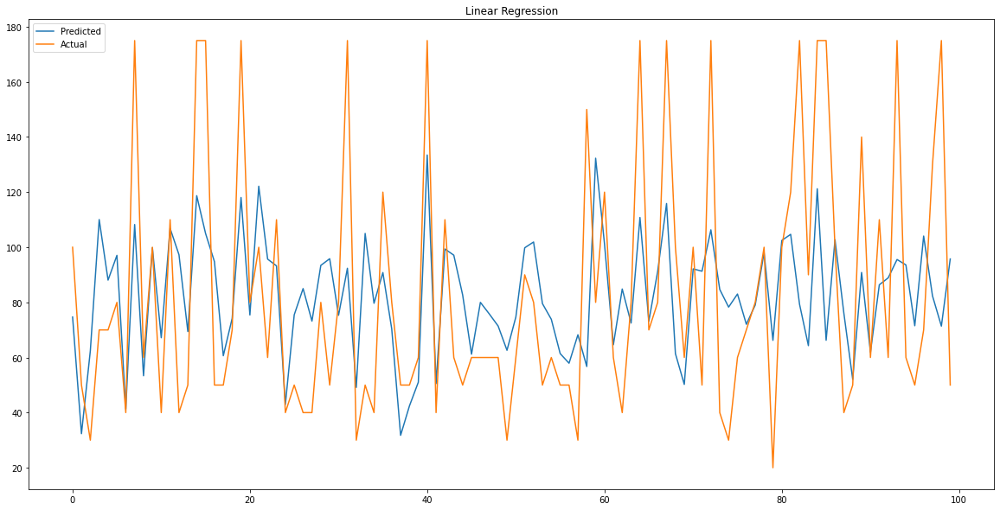


Report Updated
----------

-------
Training Lasso(alpha=0.2) ...

PredictingLasso(alpha=0.2) scores ...


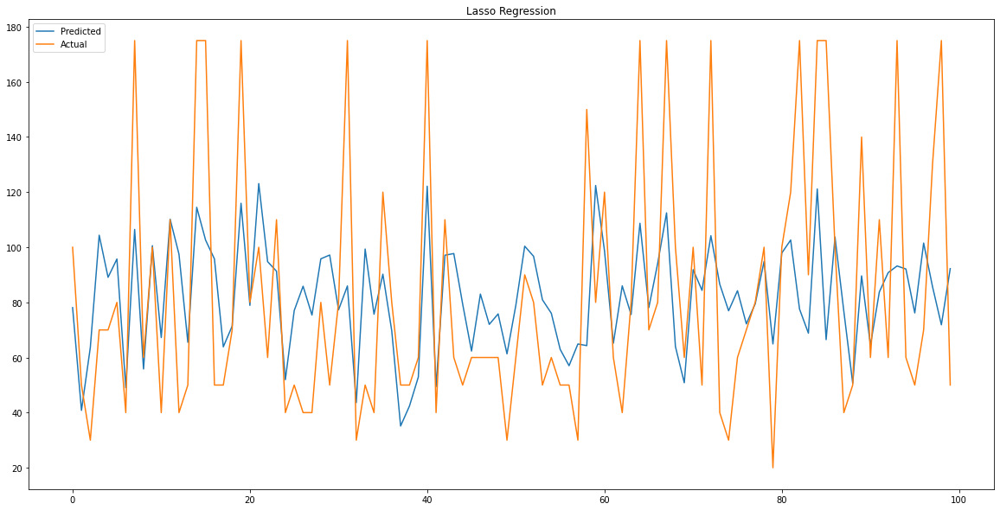


Report Updated
----------

-------
Training Ridge(alpha=0.5) ...

PredictingRidge(alpha=0.5) scores ...


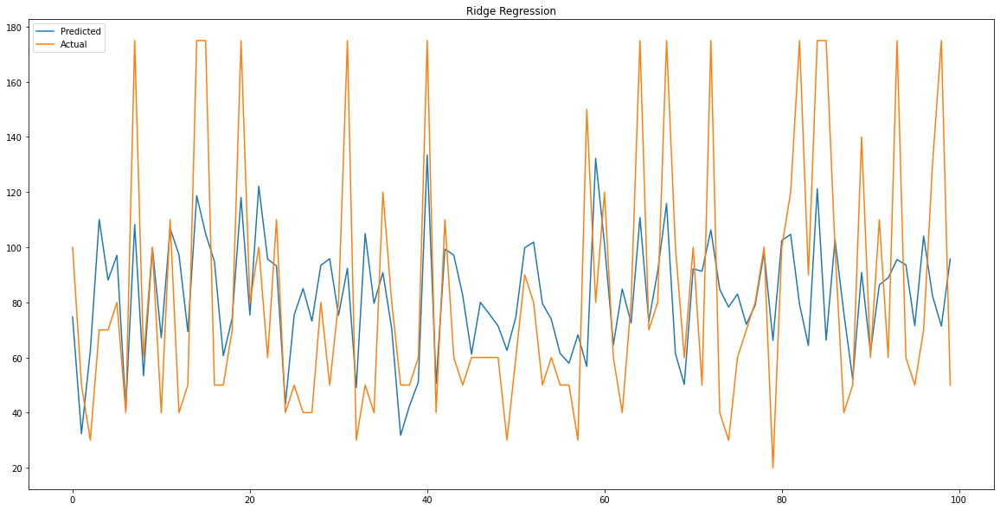


Report Updated
----------

-------
Training DecisionTreeRegressor() ...

PredictingDecisionTreeRegressor() scores ...


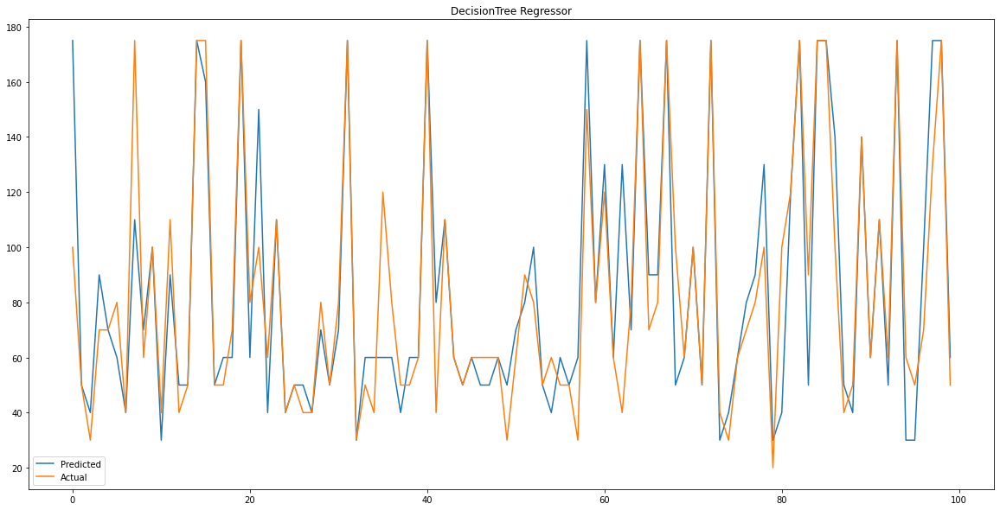


Report Updated
----------

-------
Training RandomForestRegressor() ...

PredictingRandomForestRegressor() scores ...


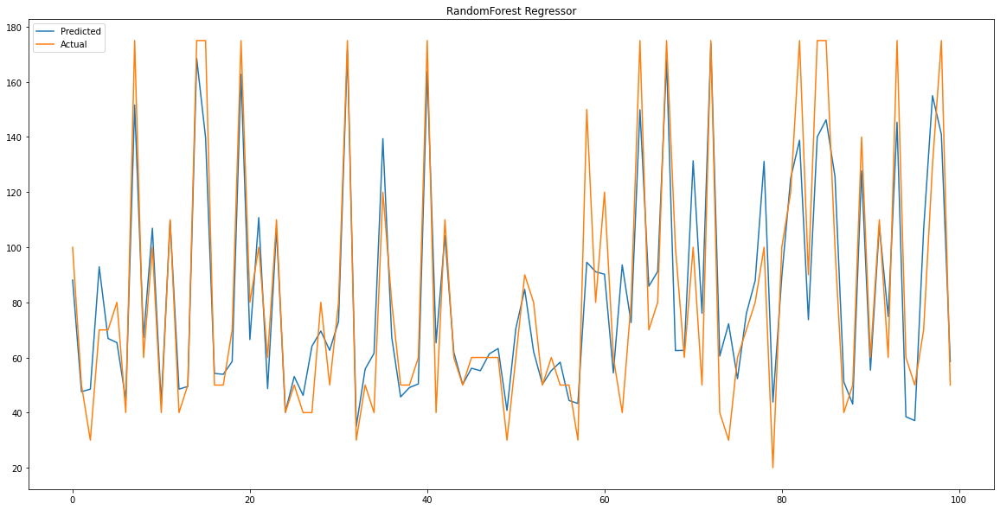


Report Updated
----------

-------
Training AdaBoostRegressor() ...

PredictingAdaBoostRegressor() scores ...


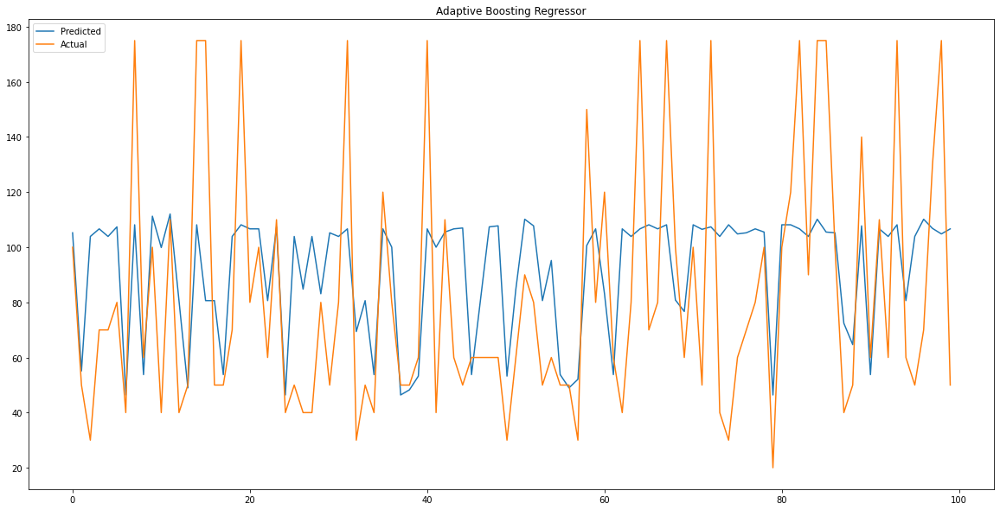


Report Updated
----------

-------
Training GradientBoostingRegressor() ...

PredictingGradientBoostingRegressor() scores ...


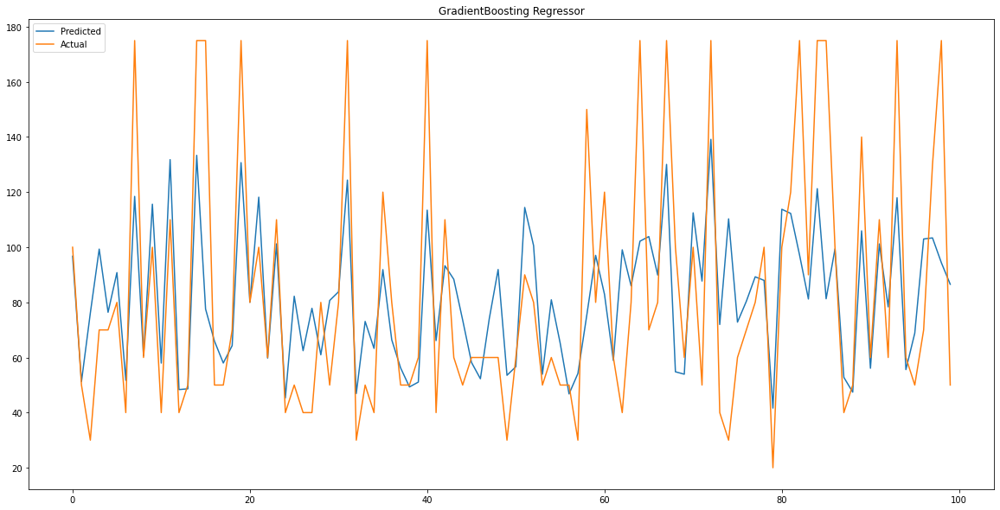


Report Updated
----------

-------
Training BaggingRegressor() ...

PredictingBaggingRegressor() scores ...


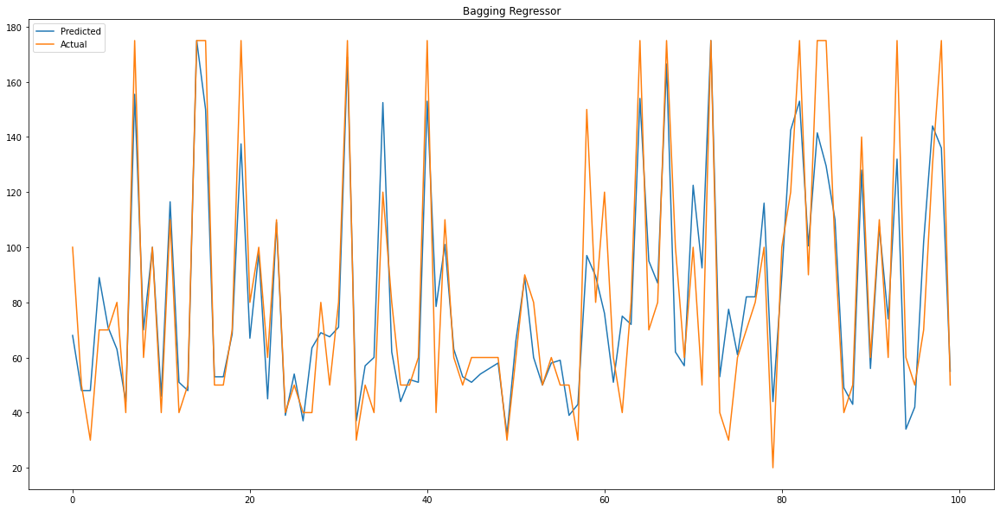


Report Updated
----------

-------
Training KNeighborsRegressor() ...

PredictingKNeighborsRegressor() scores ...


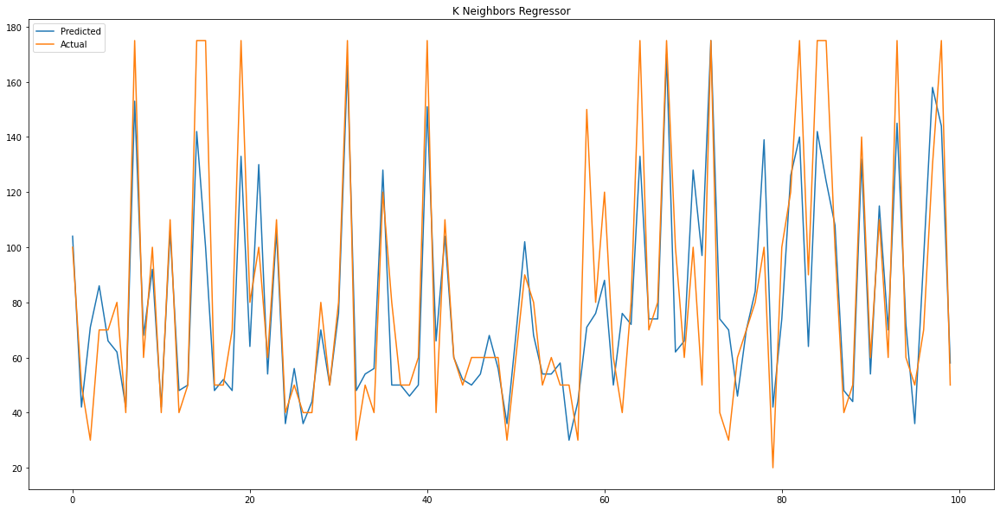


Report Updated
----------

-------
Training LinearSVR() ...

PredictingLinearSVR() scores ...


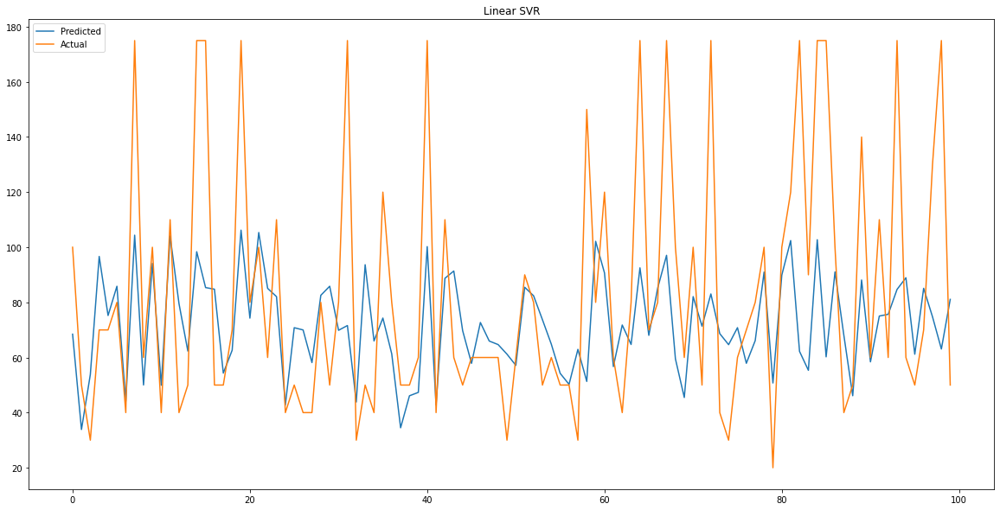


Report Updated
----------



In [54]:
Model, modelname, modeltype = get_models()
for i in range(len(Model)):
  evaluate(modeltype[i], modelname[i], Model[i], X_train_scaled , y_train, X_test_scaled,y_test)

In [102]:
# split into training and testing sets and standardize them
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 1)
std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)
from sklearn.linear_model import Lasso
lasso  = Lasso(alpha=0.0001 , max_iter= 3000)

lasso.fit(X_train, y_train)
lasso.score(X_train, y_train)
lasso.coef_
### Cross validation
from sklearn.model_selection import GridSearchCV
lasso = Lasso()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100,0.0014]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)
lasso_regressor.fit(X_train, y_train)
print("The best fit alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)
y_pred_lasso = lasso_regressor.predict(X_test)
MSE  = mean_squared_error((y_test), (y_pred_lasso))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test), (y_pred_lasso))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_pred_lasso)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

The best fit alpha value is found out to be : {'alpha': 0.0014}

Using  {'alpha': 0.0014}  the negative mean squared error is:  -1341.510713532947
MSE : 1381.6522860025696
RMSE : 37.17058361127209
R2 : 0.2772278252178264
Adjusted R2 :  0.2729536830749465


In [ ]:
from sklearn.linear_model import Ridge
ridge = Ridge()
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)
ridge_regressor.fit(X_train,y_train)
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)
y_pred_ridge = ridge_regressor.predict(X_test)
MSE  = mean_squared_error((y_test), (y_pred_ridge))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test), (y_pred_ridge))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_pred_ridge)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

In [ ]:
from sklearn.linear_model import ElasticNet
#a * L1 + b * L2
#alpha = a + b and l1_ratio = a / (a + b)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)
elasticnet.fit(X_train,y_train)
elasticnet.score(X_train, y_train)
y_pred_en = elasticnet.predict(X_test)
MSE  = mean_squared_error((y_test), (y_pred_en))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test), (y_pred_en))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_en)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))
elastic = ElasticNet()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.3,0.4,0.5,0.6,0.7,0.8]}
elastic_regressor = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error',cv=5)
elastic_regressor.fit(X_train, y_train)
print("The best fit alpha value is found out to be :" ,elastic_regressor.best_params_)
print("\nUsing ",elastic_regressor.best_params_, " the negative mean squared error is: ", elastic_regressor.best_score_)
y_pred_elastic = elastic_regressor.predict(X_test)
MSE  = mean_squared_error((y_test), (y_pred_elastic))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((y_test), (y_pred_elastic))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score((y_test), 10**(y_pred_elastic)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))


In [103]:
display_report()

,model_type,model_name,rmse,mae,R2,adjusted R2
0,Linear,Linear Regression,37.615812,27.648571,0.253287,0.173186
1,Linear,Lasso Regression,37.876826,27.801284,0.242889,0.156006
2,Linear,Ridge Regression,37.615889,27.648391,0.253284,0.173160
3,Tree,DecisionTree Regressor,28.130118,15.909552,0.582405,0.511891
4,Ensemble Method,RandomForest Regressor,21.691179,14.271409,0.751699,0.696623
5,Ensemble Method,Adaptive Boosting Regressor,38.998332,31.280340,0.197390,0.195484
6,Ensemble Method,GradientBoosting Regressor,32.050937,22.828881,0.457882,0.345117
7,Ensemble Method,Bagging Regressor,22.490610,14.672283,0.733059,0.683537
8,Neighbours,K Neighbors Regressor,24.530891,16.107677,0.682430,0.612083
9,SVM,Linear SVR,39.573931,26.496576,0.173523,0.045513


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

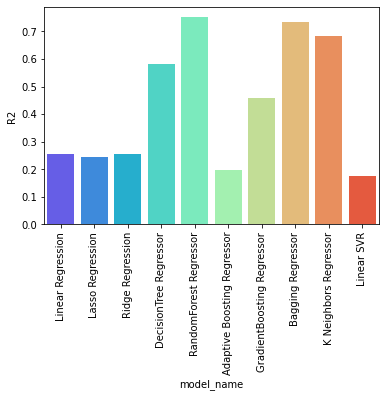

In [56]:
final_report = display_report()
sns.barplot(x = final_report['model_name'], y = final_report['R2'], palette = 'rainbow')
plt.xticks(rotation = 90)

Spot-checking is a way
of discovering which algorithms
perform well on the machine
learning problem

RandomForest Regressor has the lowest mae, rmse and highest R2 score.



#HyperParameter Tuning

From the observations, it is found
that the Random Forest Regressor
performed the best with the least
RMSE and MAE of 21.003 and
13.983 and the highest R-squared
score of 0.767
In order to improve the performance
of Random Forest Regressor,
RandomSearchCV is used to
optimize its parameters

In [57]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [58]:
seed=5
param_grid = param_grid = { 'bootstrap': [True], 
                          'max_depth': [5,8],
                          'criterion' :['squared_error'],
                          'max_features': [ 'log2', 'sqrt'], 
                          'n_estimators': [300,400]}
random_forest = RandomForestRegressor(random_state=seed)
kfold = KFold(n_splits= 5)
search = RandomizedSearchCV(estimator= random_forest, param_distributions = param_grid, scoring='r2', n_jobs = -1, verbose = 5)
search_result = search.fit(X_train_scaled, y_train)
search_result

Fitting 5 folds for each of 8 candidates, totalling 40 fits


RandomizedSearchCV(estimator=RandomForestRegressor(random_state=5), n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'criterion': ['squared_error'],
                                        'max_depth': [5, 8],
                                        'max_features': ['log2', 'sqrt'],
                                        'n_estimators': [300, 400]},
                   scoring='r2', verbose=5)

In [59]:
search_result.best_params_ , search_result.best_score_

({'n_estimators': 300,
  'max_features': 'sqrt',
  'max_depth': 8,
  'criterion': 'squared_error',
  'bootstrap': True},
 0.4743923282764874)

-------
Training RandomForestRegressor(max_features='log2', n_estimators=300) ...

PredictingRandomForestRegressor(max_features='log2', n_estimators=300) scores ...


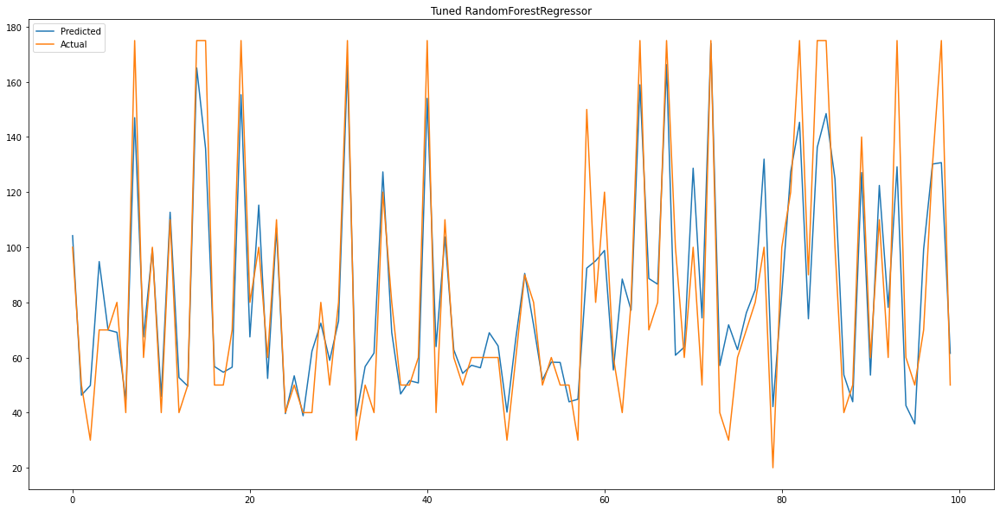


Report Updated
----------



In [60]:
tuned_random_forest = RandomForestRegressor(bootstrap = True, criterion = 'squared_error', max_features = 'log2', n_estimators = 300)
evaluate("Ensemble Method", "Tuned RandomForestRegressor", tuned_random_forest , X_train_scaled , y_train, X_test_scaled,y_test)

In [110]:
display_report()

,model_type,model_name,rmse,mae,R2,adjusted R2
0,Linear,Linear Regression,37.615812,27.648571,0.253287,0.173186
1,Linear,Lasso Regression,37.876826,27.801284,0.242889,0.156006
2,Linear,Ridge Regression,37.615889,27.648391,0.253284,0.173160
3,Tree,DecisionTree Regressor,28.130118,15.909552,0.582405,0.511891
4,Ensemble Method,RandomForest Regressor,21.691179,14.271409,0.751699,0.696623
5,Ensemble Method,Adaptive Boosting Regressor,38.998332,31.280340,0.197390,0.195484
6,Ensemble Method,GradientBoosting Regressor,32.050937,22.828881,0.457882,0.345117
7,Ensemble Method,Bagging Regressor,22.490610,14.672283,0.733059,0.683537
8,Neighbours,K Neighbors Regressor,24.530891,16.107677,0.682430,0.612083
9,SVM,Linear SVR,39.573931,26.496576,0.173523,0.045513


Upon tuning, the r2 score has been improved from 0.751699 to 0.767374.

#Model Explainability

Importance: Feature
Importance refers to techniques that
assign a score to input features based
on how useful they are at predicting
a target variable.
Feature importance scores provide
insight into the data and the deployed
model.

By looking at the Feature Importance
graphs and the contribution chart
from ELI5, we can gather that the
appliance energy consumption
largely depends on the time of the
day and temperatures in rooms 3 and
2.

##Feature Importance

In [62]:
def get_features_importance (optimal_model,X_train):
  '''
  shows the graph of feature importance
  '''
  features = X_train.columns
  importances = optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.figure(figsize=(15,15))
  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='m', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')

  plt.show()

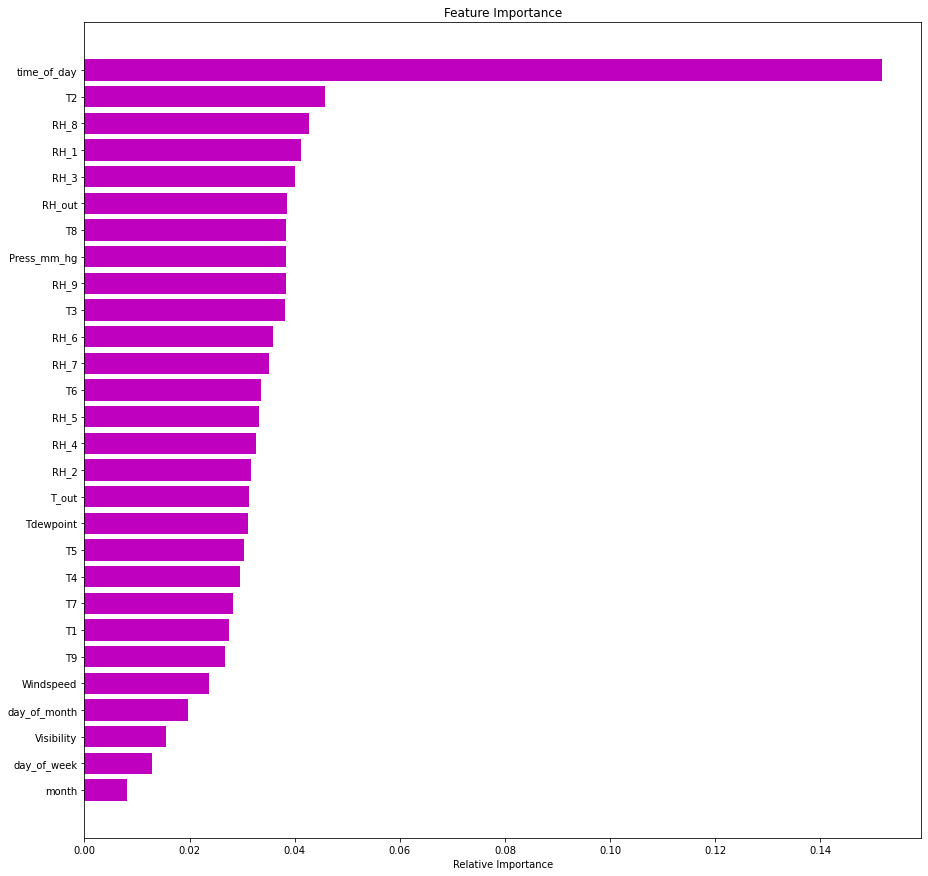

In [63]:
# Getting features importance of decision tree
get_features_importance(tuned_random_forest,X_train_scaled )

##Eli5

In [64]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [65]:
import eli5 as eli

In [66]:
for_instance=2

In [67]:
eli.explain_weights(tuned_random_forest)

Weight,Feature
0.1516 ± 0.1302,x24
0.0458 ± 0.0430,x2
0.0426 ± 0.0287,x15
0.0412 ± 0.0228,x1
0.0401 ± 0.0191,x5
0.0386 ± 0.0376,x20
0.0384 ± 0.0180,x14
0.0384 ± 0.0163,x19
0.0383 ± 0.0209,x17
0.0381 ± 0.0207,x4


In [101]:
 y_test.iloc[1]

60.0

In [69]:
eli.show_prediction(tuned_random_forest, X_test_scaled.iloc[1],
                    feature_names=list(X_test_scaled.columns),
                    show_feature_values=True)

## LIME

In this section, we’ll be
assessing predictions of the tuned model
using LIME.

In [70]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [71]:
categorical_names = list(X_train_scaled.columns[28:])

In [72]:
len(X_train_scaled.columns)

28

In [73]:
categorical_features = np.arange(28,59,1)

In [74]:
import lime
import lime.lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_scaled.values,
                                                   feature_names= list(X_train_scaled.columns),
                                                   categorical_names = categorical_names,
                                                   categorical_features =categorical_features,
                                                   mode = 'regression'
                                                   )  

In [75]:
exp = explainer.explain_instance(X_test_scaled.iloc[9],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[9])

Actual Value 100.0


The appliance energy values have increased
compared to the previous case, as there’s
positive contribution for the Phase of Day
not being Night and the Phase of the Day
being Evening.

In [76]:
exp = explainer.explain_instance(X_test_scaled.iloc[55],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[55])

Actual Value 50.0


Here, we have an appliance
energy consumption prediction of 51.52
Wh. This is a relatively low value as it is
considerably close to its minimum value
of 51.52.

In [77]:
exp = explainer.explain_instance(X_test_scaled.iloc[108],tuned_random_forest.predict,num_features=10,top_labels=1)
exp.show_in_notebook(show_table=True, show_all=True)
print("Actual Value", y_test.iloc[108])

Actual Value 90.0


#Conclusion



*   The household appliance energy
consumption prediction models based on
Linear Regression, Lasso Regression, Ridge
Regression, DecisionTree Regressor
Random Forest Regressor, Adaptive
Boosting Regressor, Gradient Boosting
Regressor, Bagging Regressor, K Neighbors
Regressor and Linear SVM are explored.

* Upon appropriate preprocessing and fitting
the ten models, we compare and evaluate the
best model with lowest error and the highest
R-squared score.

* When evaluating the influence of Random
Variable attribute the linear models have
assigned near zero weights to the random
variable, negating its influence in prediction
of the target variable.

* Random Forest Regressor was found to be
the best performing model with an
R-squared score of 0.767.

* After optimizing the hyperparameters of the
Random Forest Regressor, its R-squared
score increased from 0.767 to 0.771.

* We find that this model’s predictions are
mainly contributed by the time of the day
and temperature in rooms 3 and 2.

* As this dataset has a time component to it,
we believe that better performances can be
achieved by using Time Series Analysis
concepts.




In [112]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X_train_scaled.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X_train_scaled.shape[1])]

    return(vif)

p=calc_vif(df[[i for i in df.describe().columns]])
p.sort_values(by='VIF')

,variables,VIF
23,Tdewpoint,1.460617
20,RH_out,1.570250
10,T6,1.572346
22,Visibility,1.667697
25,day_of_month,3.901670
27,month,5.256100
18,T_out,6.203130
26,day_of_week,7.719490
15,RH_8,8.916638
7,RH_4,9.043501
